# [E-10] CIFAR-10 Image Generation
"Exploration Node 10. DCGAN CIFAR-10 Image Generation" / 2022. 02. 10 (Thu) 이형주

## Contents
---
- **1. Strategic approach to this project**
- **2. Environment Setup & Model Preparations**
- **3. Model Training & Fine Tuning**
- **4. Project Retrospective**


## Rubric Evaluation Standards
---

|  평가문항  |  상세기준  |
|:---------|:---------|
|1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.|오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.
|2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.|gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.
|3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.|제출 아이디어를 제출 프로젝트에 반영하고, 그 결과가 아이디어 적용 이전보다 향상되었음을 시각적으로 입증하였다.

## 1. Strategic approach to this project

+ 체크포인트 없이, 최소한의 시도로 최대의 결과를 얻고 Rubric 기준을 만족시키기 위한 리서치를 진행하였다.
    - 어떻게 하면 오브젝트 종류를 육안으로 더 잘 구별하게 만드는가?
    - fake accuracy를 어떻게 하면 0.5에 가깝게 하향시키고, 이미지 품질 향상을 유도하는가?
    - 어떤 학습과정을 개선하여야 모델 성능이 더 좋아지는가?

**리서치 결과**

+ 동일한 데이터셋으로 실험한 [블로그 글](https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/)을 참고하였고 귀한 힌트를 얻을 수 있었다.
    - Epochs는 100 - 200회 진행하면 오브젝트 분류 목표를 충분히 얻어낼 수 있다.
    - Epochs를 90회 -> 100회 과정에서 마이너한 성능 향상이 있었다.
+ DCGAN을 Pytorch로 구현한 예시를 참고하였고 특히 각종 변수의 가중치 값을 주목하였다. [블로그](https://kangbk0120.github.io/articles/2017-08/dcgan-pytorch)
+ 10개의 이미지 종류로 구성돼 있다: airplanes, cars, birds, cats, deer, dogs, frogs, horses, ships, and trucks. There are 6,000 images. / Source: [Wikipedia](https://en.wikipedia.org/wiki/CIFAR-10)
+ GAN 성능 향상을 위한 17가지 방법 문서를 참고하였다.  / Source: [Github](https://github.com/soumith/ganhacks)
    - Generator, Discriminator는 Encoder, Decoder와는 다른 개념으로 Layer Filters, Output Shape를 다르게 조정하는 것이 좋다.
    - Layer 구성 이후, Parameters와 Generator의 Edge 생성을 진행하면 도움이 된다.
+ 이미지의 Blurring을 줄이기 위한 GAN Image Deblurring 문서를 참고하였다. / Source: [SICARA](https://www.sicara.ai/blog/2018-03-20-gan-with-keras-application-to-image-deblurring)
+ Adam Optimizer의 Learning Rate를 조절하는 것도 효과가 있을 수 있음을 확인하였다. / Source: [Hindawi](https://www.hindawi.com/journals/jhe/2020/8889412/)
+ 구글 검색결과, GAN은 Accuracy(Fake Accuracy 포함)이 Batch 결과에 따라 그래프 형태가 상이했다.

## 2. Environment Setup & Model Preparations

In [1]:
#environment
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)

tensorflow 2.6.0


In [2]:
cifar10 = tf.keras.datasets.cifar10
(train_x, _), (test_x, _) = cifar10.load_data()

In [3]:
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


In [4]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화.

print("max:", train_x.max())
print("min:", train_x.min())

max: 1.0
min: -1.0


In [5]:
train_x.shape

(50000, 32, 32, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


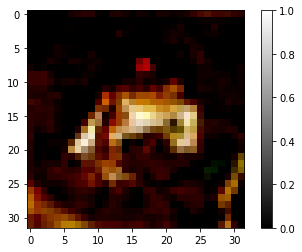

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

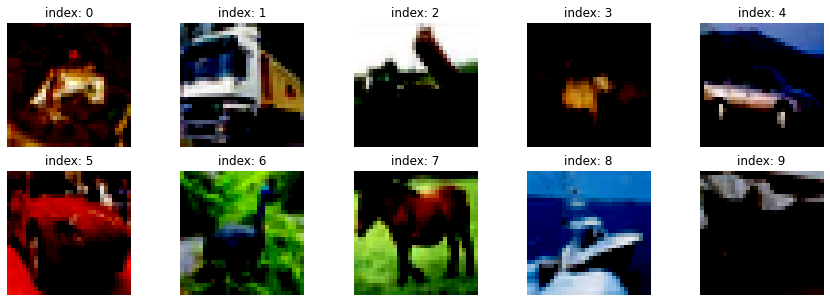

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

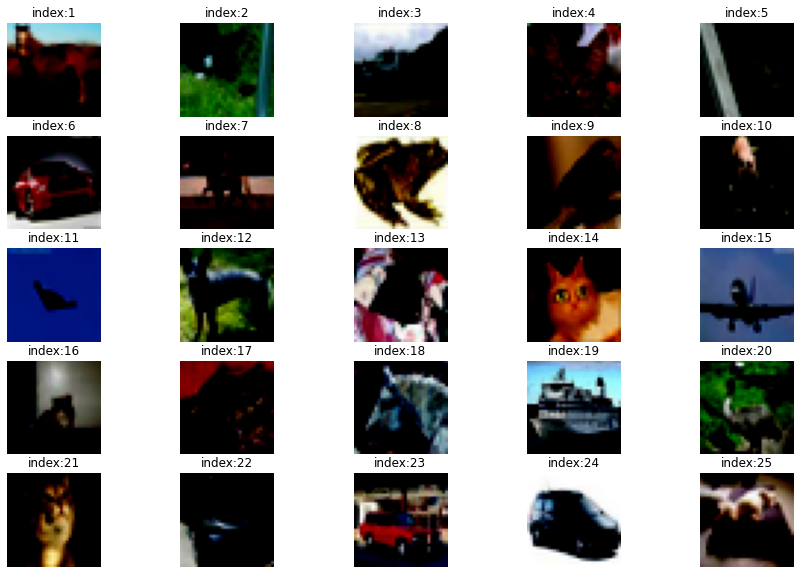

In [6]:
plt.imshow(train_x[0].reshape(32, 32, 3), cmap='gray')
plt.colorbar()
plt.show()


plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_x[i].reshape(32, 32, 3), cmap='gray')
    plt.title(f'index: {i}')
    plt.axis('off')
plt.show()


plt.figure(figsize=(15, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow(train_x[random_index].reshape(32, 32, 3))
    plt.title(f'index:{i+1}')
    plt.axis('off')
plt.show()

In [7]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

In [8]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [39]:
#generator model (생성)
def generator_model(in_shape=(32, 32, 3)):

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model


generator = generator_model()
generator.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_6 (Batch (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 16384)             0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_7 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 8, 8, 128)        

In [11]:
#noise
noise = tf.random.normal([1, 100])

In [12]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

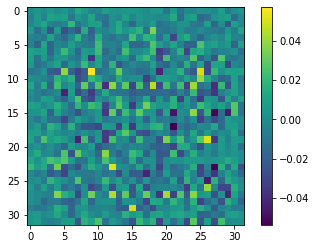

In [13]:
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

In [14]:
#discriminator model (판별)
def discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

discriminator = discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [16]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00068262]], dtype=float32)>

In [17]:
# Optimizer, Loss & Accuracies

## 1. Loss Function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output)*(1-0.1), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

## 2. Accuricies
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 3. Optimizer
generator_optimizer = tf.keras.optimizers.Adam(2e-4) ## 3e-4 -> 2e-4
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4) ## 3e-4 -> 2e-4

## 4. Result Samples (16 images/each epoch)
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

## 3. Model Training & Fine Tuning

In [18]:
# Model Architecture
@tf.function
def train_step(images):  #Input data
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #Input noise

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  # tf.GradientTape()
        generated_images = generator(noise, training=True)  #generated_images

        #(5)discriminator
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6)loss
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7)accuracy 
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8)gradient
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9)model training
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10)return

# Save images per Epoch
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(np.array(predictions[i]*127.5 + 127.5).astype('uint8')) #(-1,1)로 정규화를 다시 (0,255)로
        plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()
    
# Visualizations
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기: 15,6으로

def draw_train_history(history, epoch):
    # history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # epoch별로 그래프를 이미지 파일로 저장
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

# Checkpoints to save training model
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [19]:
#model training
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}
    
    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)            
            history['real_accuracy'].append(real_accuracy)            
            history['fake_accuracy'].append(fake_accuracy)  
            
            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('estimated epoch time per {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))
                
        if (epoch+1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
        
        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('training time : {}sec'.format(int(time.time()-start)))
        
        draw_train_history(history, epoch)
        
        
save_every = 10
EPOCHS = 150

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

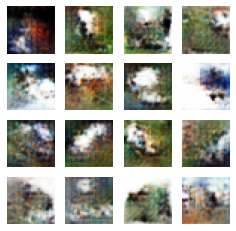

training time : 2378sec


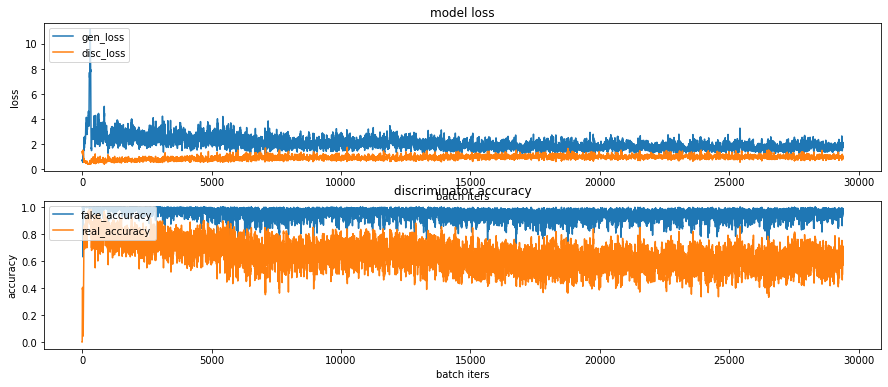

In [20]:
train(train_dataset, EPOCHS, save_every)

In [21]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif

-rw-r--r-- 1 root root 1811886 Feb 15 09:20 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif


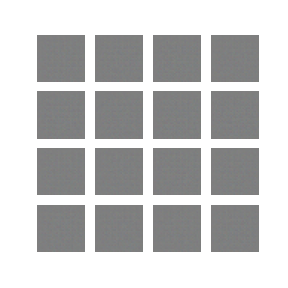

**중간 평가**

+ 배경 구분과 형체의 틀이 관찰되었다. 또한 Fake Accuracy는 0.8 정도에 수렴하고 있다.
+ 이를 더 0.5에 가깝게 끌어내리고 이미지를 더 선명하게 하기 위하여 추가 조치를 취한다.


아래 문서들을 참고하여 추가 조치를 진행하였다.

[Tips for Training Stable Generative Adversarial Networks](https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/)

[Improved Techniques for Training GANs(paper)](https://proceedings.neurips.cc/paper/2016/file/8a3363abe792db2d8761d6403605aeb7-Paper.pdf)

    - Layer 추가, Epoch 추가 (150 -> 300)
    - Hyperparameter 수정
        * [ADD] learning_rate = 0.002
        * [ADD] beta_1 = 0.5
        * [MODIFIED] epsilon = 2e-04 -> 2e-07

In [22]:
def discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # Third: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fourth: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # Fifth: Flatten Layer
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.4))
    model.add(layers.Dense(1, activation='sigmoid'))

    return model



discriminator = discriminator_model()
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 16, 16, 64)        1792      
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         73856     
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 4, 4, 128)         147584    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 4, 4, 128)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 2, 2, 128)        

In [23]:
# Optimizer, Loss & Accuracies

## 1. Loss Function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output)*(1-0.1), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

## 2. Accuricies
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 3. Optimizer
generator_optimizer = tf.keras.optimizers.Adam(epsilon=2e-07) 
# 3e-4 -> 2e-4 -> 2e-7
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=2e-07) 
# 3e-4 -> 2e-4 -> 2e-7

## 4. Result Samples (16 images/each epoch)
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

In [24]:
# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

save_every = 10
EPOCHS = 300

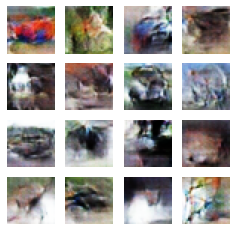

training time : 4954sec


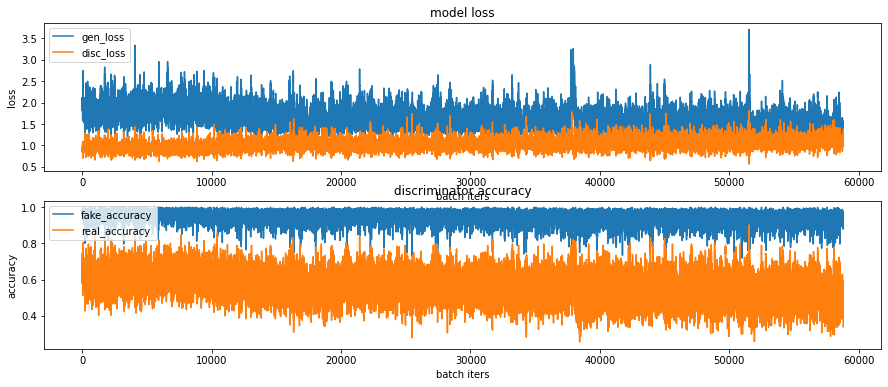

CPU times: user 1h 24min 55s, sys: 7min 55s, total: 1h 32min 50s
Wall time: 1h 22min 38s


In [25]:
%%time
train(train_dataset, EPOCHS, save_every)

In [26]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan2.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan2.gif

-rw-r--r-- 1 root root 2445569 Feb 15 11:01 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan2.gif


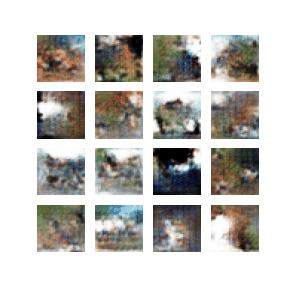

**중간 평가**

+ 형체의 구분이 가능한 수준까지 되었다. 또한 Fake Accuracy는 0.75-0.8 정도에 수렴하고 있다.
+ 이를 더 0.5에 가깝게 끌어내리고 이미지를 더 선명하게 하기 위하여 추가 조치를 취한다.

    - Epoch 추가 (100)
    - Hyperparameter 수정
        * [ADD] learning_rate = 0.002 (Generator)
        * [ADD] beta_1 = 0.5 (Generator)
        * epsilon = 2e-04 -> 2e-07

In [40]:
def discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # Third: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fourth: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # Fifth: Flatten Layer
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.4))
    model.add(layers.Dense(1, activation='sigmoid'))

    return model



discriminator = discriminator_model()
discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 16, 16, 64)        1792      
_________________________________________________________________
leaky_re_lu_23 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 8, 8, 128)         73856     
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 4, 4, 128)         147584    
_________________________________________________________________
leaky_re_lu_25 (LeakyReLU)   (None, 4, 4, 128)         0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 2, 2, 128)        

In [41]:
# Optimizer, Loss & Accuracies

## 1. Loss Function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output)*(1-0.1), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

## 2. Accuricies
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 3. Optimizer
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=2e-07) 
# 3e-4 -> 2e-4 -> 2e-7
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=2e-07) 
# 3e-4 -> 2e-4 -> 2e-7

## 4. Result Samples (16 images/each epoch)
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

In [29]:
# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

save_every = 5
EPOCHS = 100

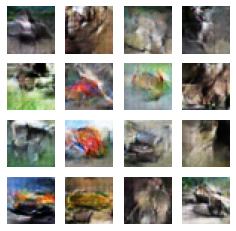

training time : 1568sec


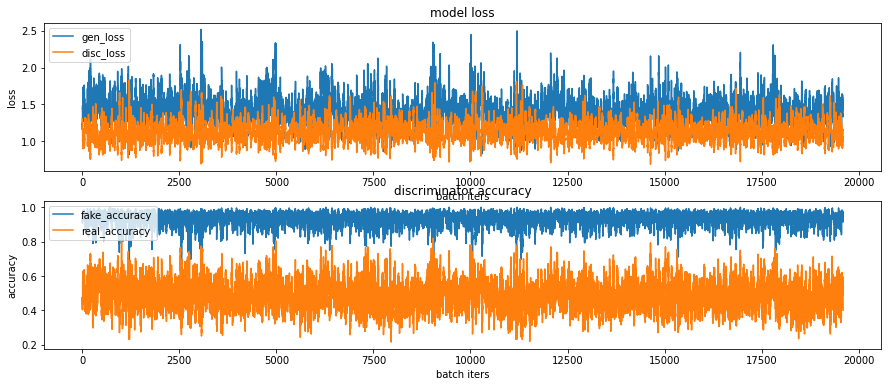

CPU times: user 27min 1s, sys: 2min 37s, total: 29min 38s
Wall time: 26min 9s


In [30]:
%%time
train(train_dataset, EPOCHS, save_every)

In [31]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif

-rw-r--r-- 1 root root 2405447 Feb 15 11:34 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif


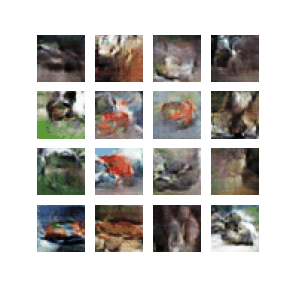

**최종 평가**

+ 새, 말, 개구리 등 확실히 이미지 구분이 가능해졌다. 또한 Fake Accuracy는 0.65-0.75 정도에 수렴하고 있다.
+ 아래 이미지는 1차, 2차, 3차 시도시 각각 동일 100 Epoch 상태에서 캡쳐한 화면과 Loss, Accuracy 분포도이다.
+ 검정색 라인을 0.4 - 0.5라고 할 때, 빨간색 선이 추세선으로서 하향곡선을 그리고 있음을 보여준다.

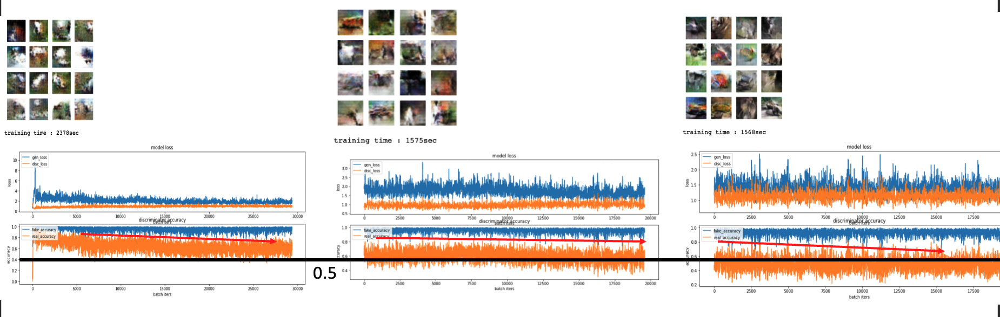

## 4. Project Retrospective

+ GAN 실험을 더 빨리, 다양하게 시도할 수 있을 GPU 성능과, 커널 시간제한(6HR)이 개인적으로 아쉬웠고 신경이 많이 쓰였다.
+ Zero Sum, Generator와 Discriminator로 나눠 서로를 개선시킨다는 모델에 대한 흥미도 있었으나, 단어의 느낌상 Discriminiator 보다는 Distinguisher 정도가 적절하지 않았을까 하는 생각이 들었다.
+ 시간이 된다면 정규화의 값을 -1, 1 사이 이외에 0과 1 등으로 더 다양하게 시도해보고 싶다.
+ 논문과, 블로그에서 확인한 코드를 이식하여 집어넣고 오류가 생기지 않도록 하는데에 아직 소극적인 부분이 있다. 이 부분은 조금 더 과감하게 시도하여 다양한 방법으로 모델 개선이 이루어지거나, 아예 새로운 모델을 집어넣는 등의 다양한 개선안을 마련하도록 역량 개선에 노력하도록 하겠다.
+ Accuracy는 경향성을 보이기는 하나 (Real, Fake) 각각 Epoch 실행시마다 Accuracy가 들쭉날쭉 하기도 한다는 것이 조금 의아한 부분이 있었다. 그렇다면 Early Stopping을 하는 것이 GAN에서는 큰 의미가 없어 보이기도 해서 이 부분을 조금 더 찾아보려고 한다.